In [43]:
import pandas as pd  
import numpy as np
import matplotlib.pyplot as plt
plt.style.use('fivethirtyeight')
import seaborn as sns
from wordcloud import WordCloud, STOPWORDS, ImageColorGenerator


%matplotlib inline
%config InlineBackend.figure_format = 'retina'


In [2]:
kaggle = pd.read_csv('Data/Emotion_final.csv')

In [3]:
kaggle.head()

,Text,Emotion
0,i didnt feel humiliated,sadness
1,i can go from feeling so hopeless to so damned...,sadness
2,im grabbing a minute to post i feel greedy wrong,anger
3,i am ever feeling nostalgic about the fireplac...,love
4,i am feeling grouchy,anger


In [4]:
kaggle.Emotion.unique()

array(['sadness', 'anger', 'love', 'surprise', 'fear', 'happy'],
      dtype=object)

## Exploratory Data

In [5]:
possible_labels = kaggle.Emotion.unique()

label_dict = {}
for index, possible_label in enumerate(possible_labels):
    label_dict[possible_label] = index
label_dict

{'sadness': 0, 'anger': 1, 'love': 2, 'surprise': 3, 'fear': 4, 'happy': 5}

In [6]:
kaggle.shape

(21459, 2)

## Word Cloud

In [45]:
# Get all Emotion
anger_msg = kaggle[kaggle.Emotion =='anger']
fear_msg = kaggle[kaggle.Emotion=='fear']# Create numpy list to visualize using wordcloud
happy_msg = kaggle[kaggle.Emotion == 'happy']
love_msg = kaggle[kaggle.Emotion == 'love']
sadness_msg = kaggle[kaggle.Emotion == 'sadness']
surprise_msg = kaggle[kaggle.Emotion == 'surprise']

anger_msg_text = " ".join(anger_msg.Text.to_numpy().tolist())
fear_msg_text = " ".join(fear_msg.Text.to_numpy().tolist())
happy_msg_text = " ".join(happy_msg.Text.to_numpy().tolist())
love_msg_text = " ".join(love_msg.Text.to_numpy().tolist())
sadness_msg_text = " ".join(sadness_msg.Text.to_numpy().tolist())
surprise_msg_text = " ".join(surprise_msg.Text.to_numpy().tolist())

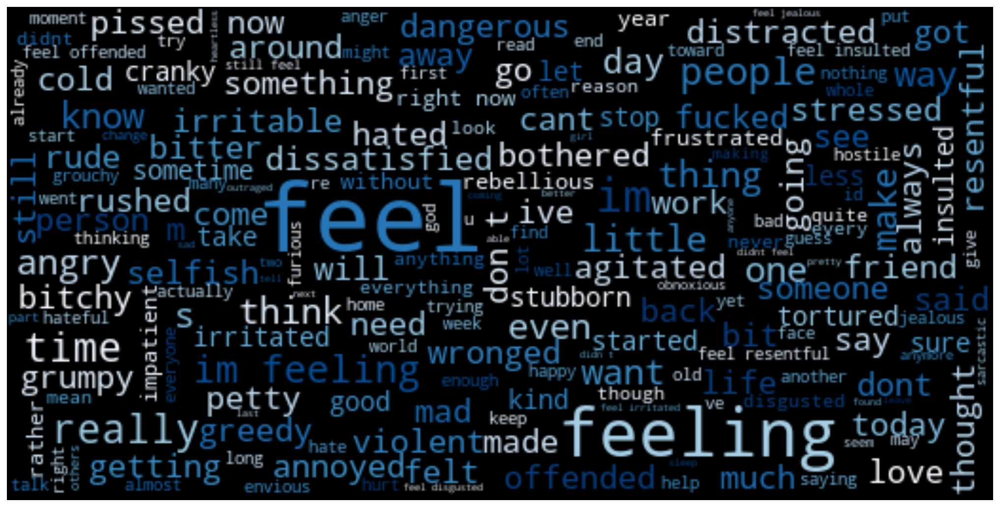

In [46]:
# wordcloud of anger messages
anger_msg_cloud = WordCloud(width =520, 
                            height =260, 
                            stopwords=STOPWORDS,
                            max_font_size=50, 
                            background_color ="black", 
                            colormap='Blues').generate(anger_msg_text)
plt.figure(figsize=(16,10))
plt.imshow(anger_msg_cloud, interpolation='bilinear')
plt.axis('off') # turn off axis
plt.show()

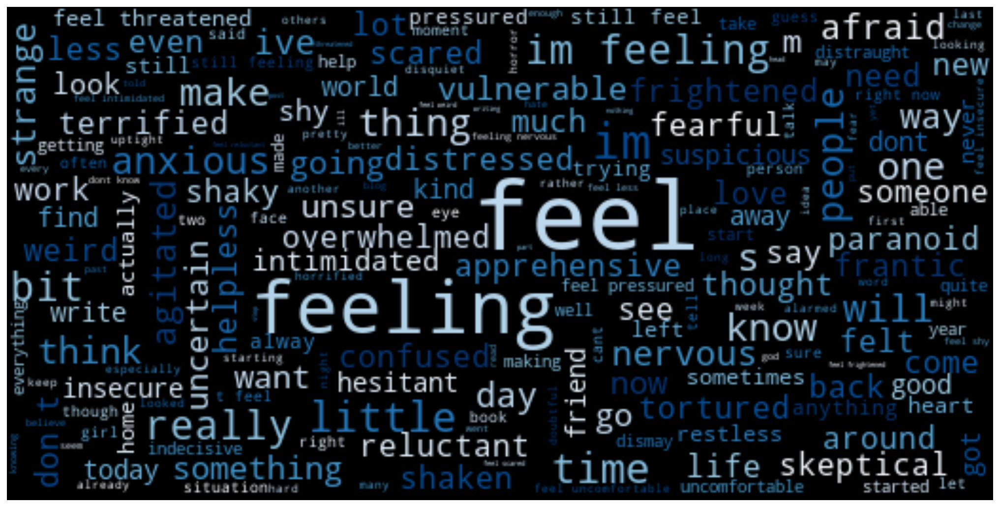

In [47]:
# wordcloud of fear messages
fear_msg_cloud = WordCloud(width =520, 
                            height =260, 
                            stopwords=STOPWORDS,
                            max_font_size=50, 
                            background_color ="black", 
                            colormap='Blues').generate(fear_msg_text)
plt.figure(figsize=(16,10))
plt.imshow(fear_msg_cloud, interpolation='bilinear')
plt.axis('off') # turn off axis
plt.show()

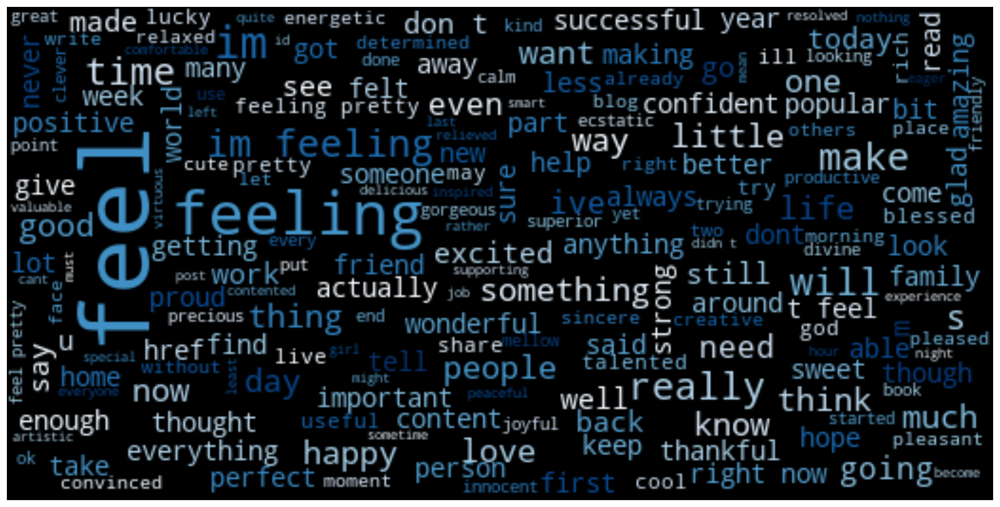

In [48]:
# wordcloud of happy messages
happy_msg_cloud = WordCloud(width =520, 
                            height =260, 
                            stopwords=STOPWORDS,
                            max_font_size=50, 
                            background_color ="black", 
                            colormap='Blues').generate(happy_msg_text)
plt.figure(figsize=(16,10))
plt.imshow(happy_msg_cloud, interpolation='bilinear')
plt.axis('off') # turn off axis
plt.show()

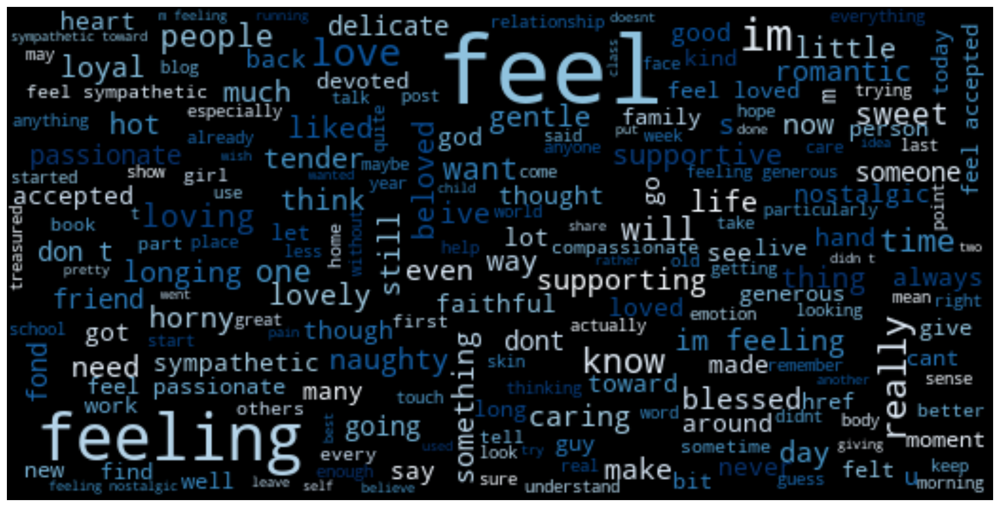

In [49]:
# wordcloud of love messages
love_msg_cloud = WordCloud(width =520, 
                            height =260, 
                            stopwords=STOPWORDS,
                            max_font_size=50, 
                            background_color ="black", 
                            colormap='Blues').generate(love_msg_text)
plt.figure(figsize=(16,10))
plt.imshow(love_msg_cloud, interpolation='bilinear')
plt.axis('off') # turn off axis
plt.show()

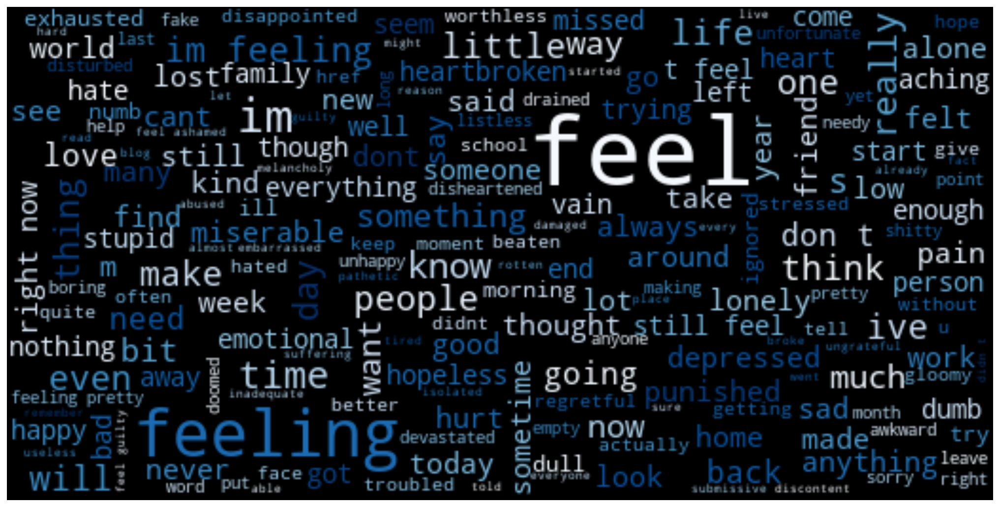

In [50]:
# wordcloud of sadness messages
sadness_msg_cloud = WordCloud(width =520, 
                            height =260, 
                            stopwords=STOPWORDS,
                            max_font_size=50, 
                            background_color ="black", 
                            colormap='Blues').generate(sadness_msg_text)
plt.figure(figsize=(16,10))
plt.imshow(sadness_msg_cloud, interpolation='bilinear')
plt.axis('off') # turn off axis
plt.show()

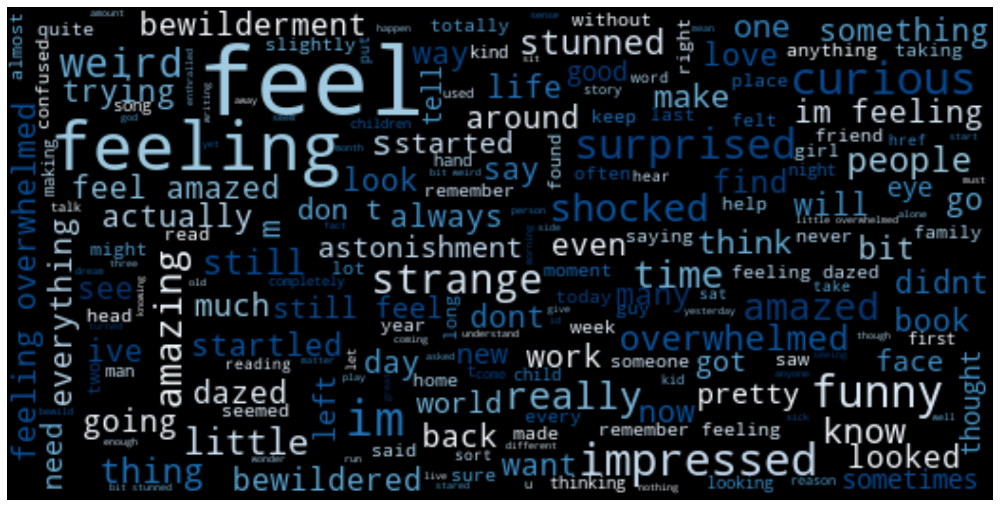

In [51]:
# wordcloud of surprise messages
surprise_msg_cloud = WordCloud(width =520, 
                            height =260, 
                            stopwords=STOPWORDS,
                            max_font_size=50, 
                            background_color ="black", 
                            colormap='Blues').generate(surprise_msg_text)
plt.figure(figsize=(16,10))
plt.imshow(surprise_msg_cloud, interpolation='bilinear')
plt.axis('off') # turn off axis
plt.show()

## Prepare Dataset

In [8]:
x = kaggle.Text
y = kaggle.Emotion


In [9]:
from sklearn.feature_extraction.text import CountVectorizer

In [10]:
vectorizer = CountVectorizer()
vectorizer = vectorizer.fit(x)
vectorizer_message = vectorizer.transform(x)

## Naive Bayes Classifier

In [11]:
from sklearn.naive_bayes import MultinomialNB

In [12]:
model = MultinomialNB()
model.fit(vectorizer_message,y)

MultinomialNB()

In [13]:
ex = ['Hello! How are you today?']
ex_vectorize = vectorizer.transform(ex)

In [14]:
y_pred = model.predict(ex_vectorize)
y_pred

array(['sadness'], dtype='<U8')

In [15]:
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(vectorizer_message, y, test_size = 0.33, random_state = 42)

In [16]:
model = MultinomialNB()
model.fit(X_train, y_train)

MultinomialNB()

In [17]:
ex = ['Hello! Im good']
ex_vectorize = vectorizer.transform(ex)

y_pred = model.predict(ex_vectorize)
y_pred

array(['sadness'], dtype='<U8')

In [18]:
from sklearn.metrics import accuracy_score

y_pred = model.predict(X_test)
accuracy_score(y_test, y_pred)

0.7205591640779441

## KNN 

In [27]:
from sklearn.neighbors import KNeighborsClassifier

model = KNeighborsClassifier(n_neighbors = 10)
model = model.fit(X_train, y_train)

In [28]:
from sklearn.metrics import accuracy_score

y_pred = model.predict(X_test)
accuracy_score(y_test, y_pred)

0.410759672408924

## Decision Tree

In [29]:
from sklearn import tree

model = tree.DecisionTreeClassifier()
model.fit(X_train, y_train)

DecisionTreeClassifier()

In [32]:
from sklearn.metrics import accuracy_score

y_pred = model.predict(X_test)
accuracy_score(y_test, y_pred)

0.8506071731149393

## RandomForestClassifier

In [33]:
from sklearn.ensemble import RandomForestClassifier

model = RandomForestClassifier()
model.fit(X_train, y_train)

RandomForestClassifier()

In [34]:
from sklearn.metrics import accuracy_score

y_pred = model.predict(X_test)
accuracy_score(y_test, y_pred)

0.8669867269133014